# Green-screen point processing - Post-graduate Class

# Mount Google Drive to Google Colab
Give Google Colab the permission to explore and use our Google Drive (Uncomment if you prefer to upload the images to your Google Drive)

In [1]:
# from google.colab import drive
# drive.mount('/content/drive')

Please upload the Workshop 1's images in the directory as shown below:  
My Drive  
&emsp;- Colab Notebooks  
&emsp; &emsp;- workshop1_imgs  
    

In [1]:
# Use this if you are using Google Colab
IMG_PATH = '/content/drive/Colab Notebooks'

IMG_PATH = "./workshop1_imgs"

# Load libraries

In [2]:
# Matplotlib is for visualization
import matplotlib.pyplot as plt
# Numpy is for computation
import numpy as np
# OpenCV (cv2) is for Computer Vision tools
import cv2
# os is for manipulating paths
import os

# Additional function to display image by using matplotlib

In [22]:
def display(img, caption=''):
    # Show image using pyplot
    plt.figure()
    plt.imshow(img)
    plt.title(caption)
    plt.axis('off')
    plt.show()

In [23]:
def display_with_figsize(img, figsize=(10,10), caption=''):
    # Show image using pyplot with chosen figsize
    plt.figure(figsize=figsize)
    # Convert from BGR to RGB
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title(caption)
    plt.axis('off')
    plt.show()

# Load the given image

In [24]:
img_name = "12.jpg"
img_file_path = os.path.join(IMG_PATH, img_name) # "./workshop1_imgs/12.jpg"

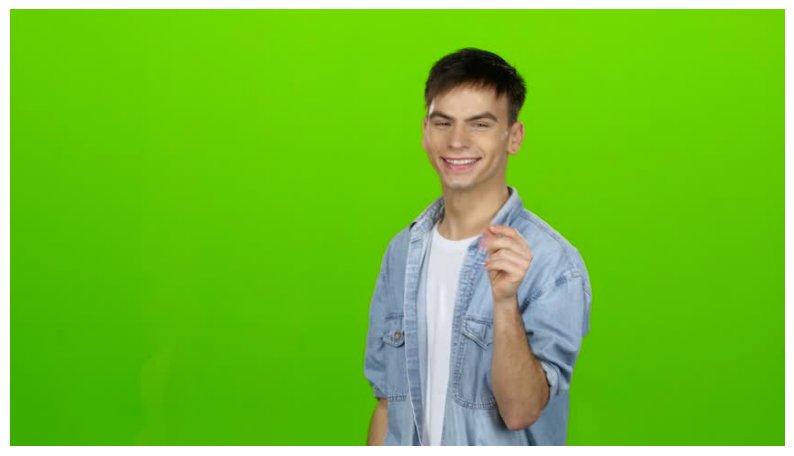

In [25]:
img = cv2.imread(img_file_path) # Be careful, OpenCV reads the input image and store it in the BGR color space instead of the modern RGB space. More info: https://stackoverflow.com/questions/14556545/why-opencv-using-bgr-colour-space-instead-of-rgb
display_with_figsize(img)
print(img.shape) # Height x Width x Number of channels (Blue-Green-Red)


(-0.5, 851.5, 479.5, -0.5)

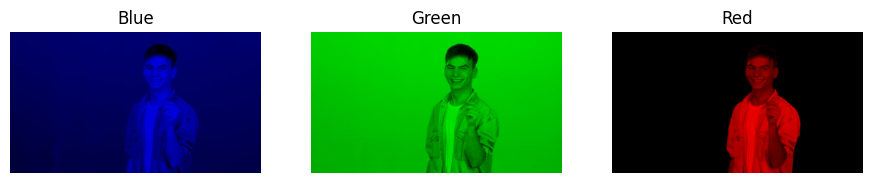

In [26]:
# Blue
img_blue = np.zeros_like(img)
img_blue[:, :, 0] = img[:, :, 0]
# Green
img_green = np.zeros_like(img)
img_green[:, :, 1] = img[:, :, 1]
# Redb
img_red = np.zeros_like(img)
img_red[:, :, 2] = img[:, :, 2]

fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(11, 7))
axs[0].imshow(img_red)
axs[0].set_title("Blue")
axs[0].axis("off")
axs[1].imshow(img_green)
axs[1].set_title("Green")
axs[1].axis("off")
axs[2].imshow(img_blue)
axs[2].set_title("Red")
axs[2].axis("off")


# Convert image from `RGB` format to `HSV`.

Why do we use HSV (Hue, Value, Saturation) instead of RGB?  
https://dsp.stackexchange.com/questions/2687/why-do-we-use-the-hsv-colour-space-so-often-in-vision-and-image-processing

In [27]:
img_hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
print(img_hsv[1,1,0]) # The hue of pixel at row 1, column 1

45


Reference: https://www.google.com/url?sa=i&url=https%3A%2F%2Fwww.ncl.ucar.edu%2FDocument%2FGraphics%2FColorTables%2FMPL_hsv.shtml&psig=AOvVaw0HP7UC6T322SvGmvVng06s&ust=1678864826784000&source=images&cd=vfe&ved=0CAMQjB1qFwoTCJiS6v7w2v0CFQAAAAAdAAAAABAE

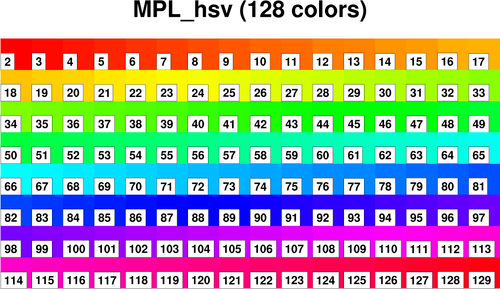

In [28]:
human_mask = (img_hsv[:,:,0] < 35) | (img_hsv[:,:,0] > 52) # 0 - hue, 1 - saturation, 2 - value
# print(mask1.sum())

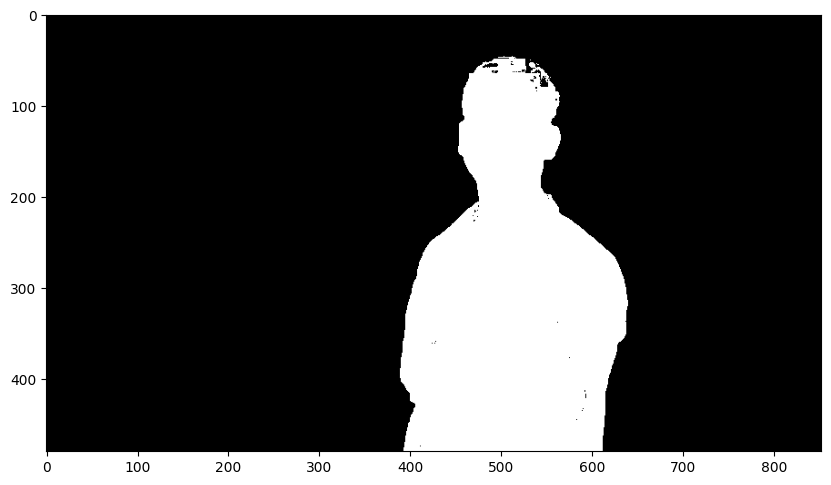

In [29]:
plt.figure(figsize=(10, 10))
plt.imshow(human_mask, cmap="gray")

# Morphopology: Closing

## Section 3.3.3 in Richard Szeliski's Computer Vision: Algorithms and Applications, 2nd edition.

Reference: https://www.google.com/url?sa=i&url=https%3A%2F%2Fpyimagesearch.com%2F2021%2F04%2F28%2Fopencv-morphological-operations%2F&psig=AOvVaw2w2e-NjT0Q48AjrsVMBmLL&ust=1678865495349000&source=images&cd=vfe&ved=0CBAQjhxqFwoTCODPz73z2v0CFQAAAAAdAAAAABAR

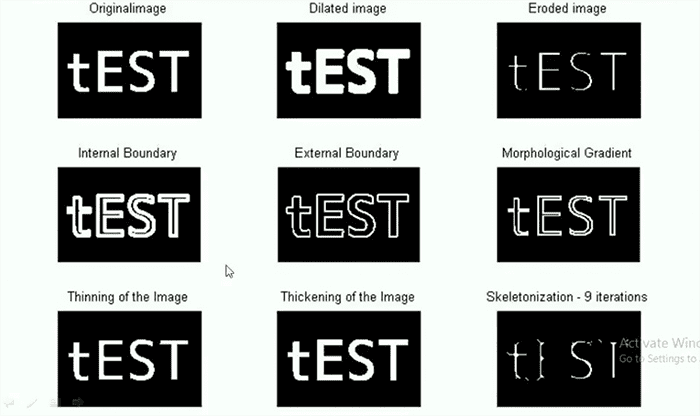

To fill (small) holes in the segmentation target, we use 'CLOSING.

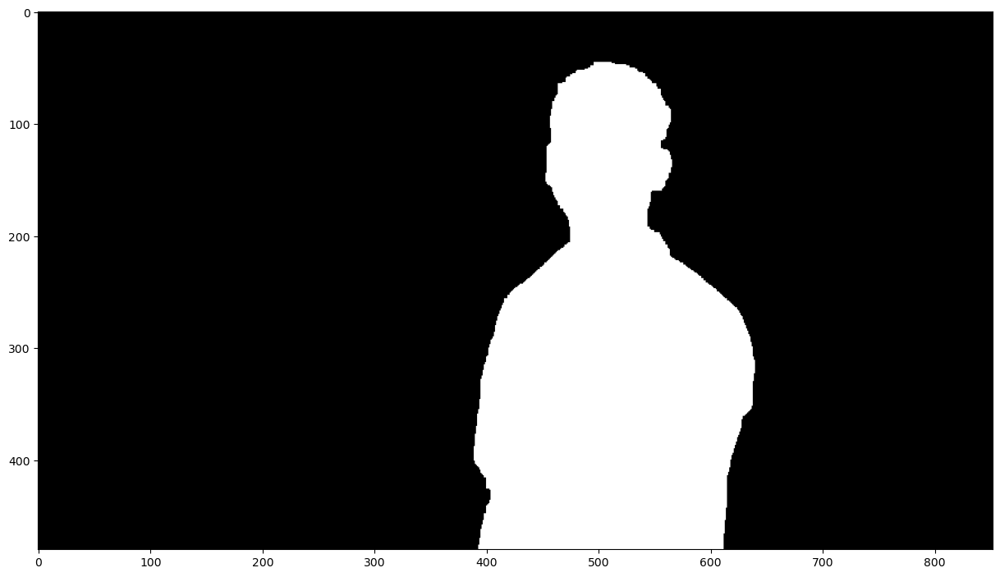

In [ ]:
kernel = np.ones((7, 7), dtype=np.uint8)
closing = cv2.morphologyEx(np.float32(human_mask), cv2.MORPH_CLOSE, kernel)
closing = closing.astype(np.uint8)
# display(closing * 255,"mask")
plt.figure(figsize=(15, 15))
plt.imshow(closing, cmap="gray")

In [ ]:
closing_mask = np.repeat(closing[:, :, np.newaxis], 3, axis=2)
print(closing_mask.shape)

(480, 852, 3)


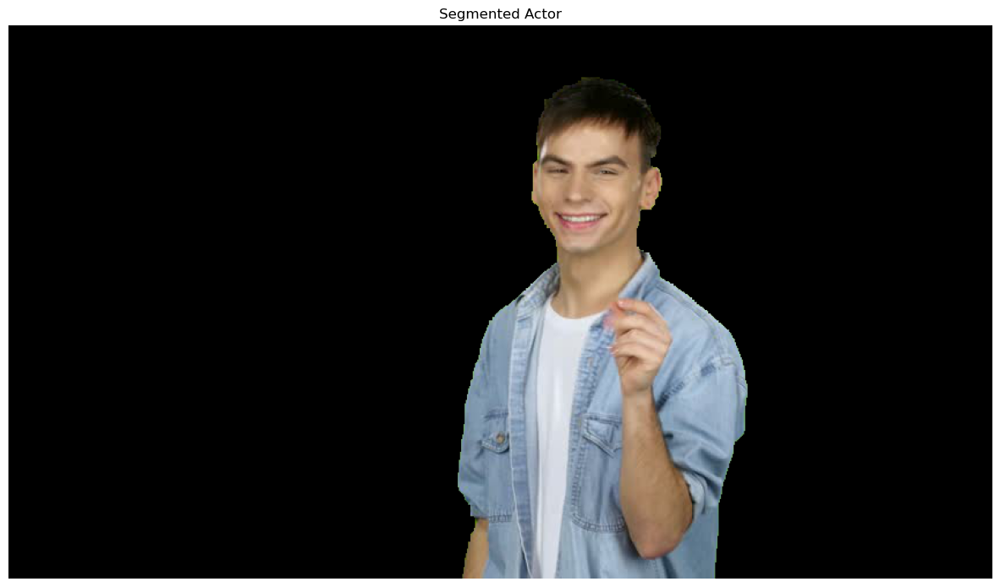

In [ ]:
segmented_actor = img * closing_mask
display_with_figsize(segmented_actor, figsize=(15, 15), caption="Segmented Actor")

In [ ]:
segmented_actor.shape

(480, 852, 3)

# The Fun part

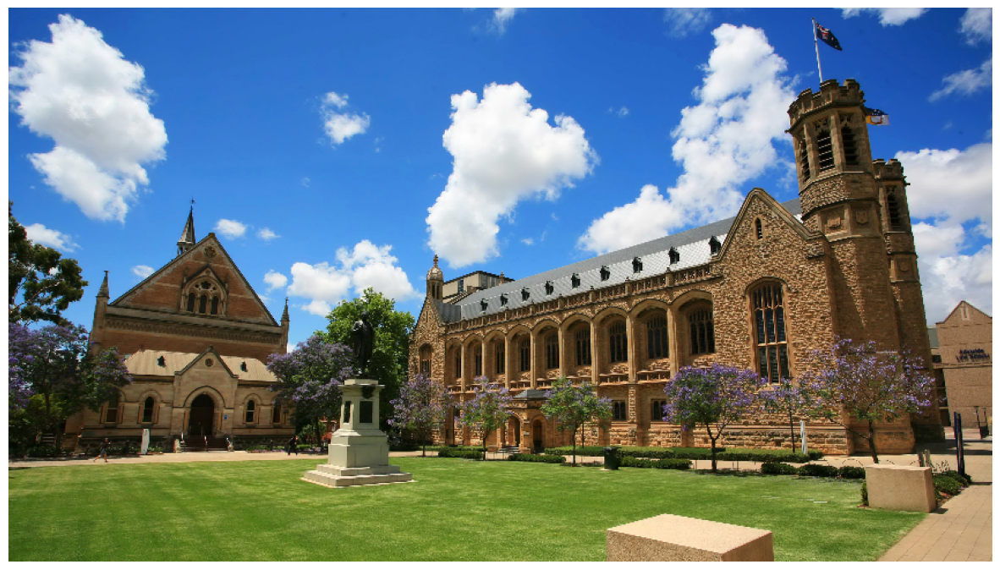

(480, 852, 3)

In [ ]:
img_name = "UoA.jpeg"
background = cv2.imread(os.path.join(IMG_PATH, img_name))
resized_background = cv2.resize(background, (852, 480)) # Resize the background if needed
display_with_figsize(resized_background, figsize=(15, 15))
resized_background.shape

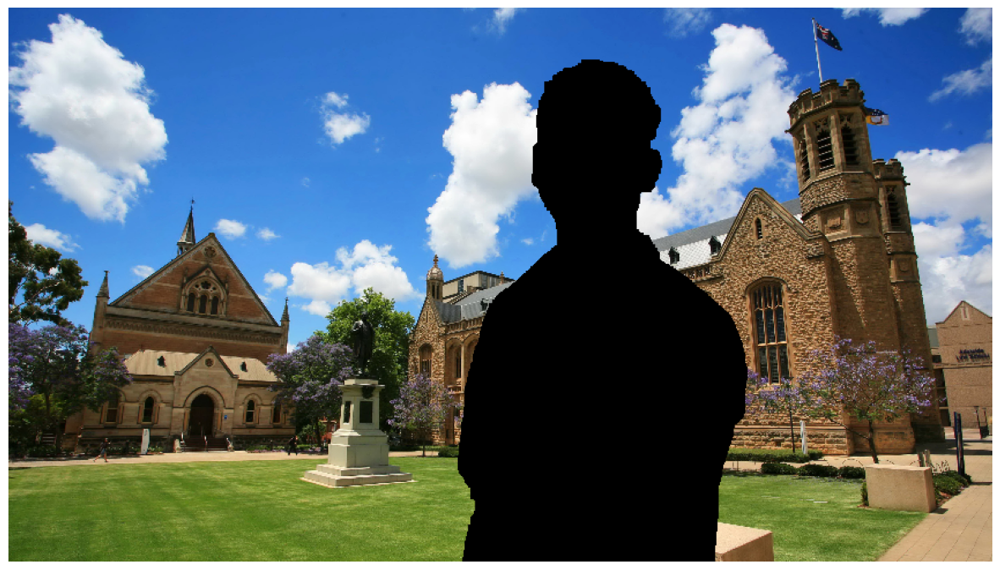

In [ ]:
segmented_background = (1 - closing_mask) * resized_background
display_with_figsize(segmented_background, figsize=(15, 15))

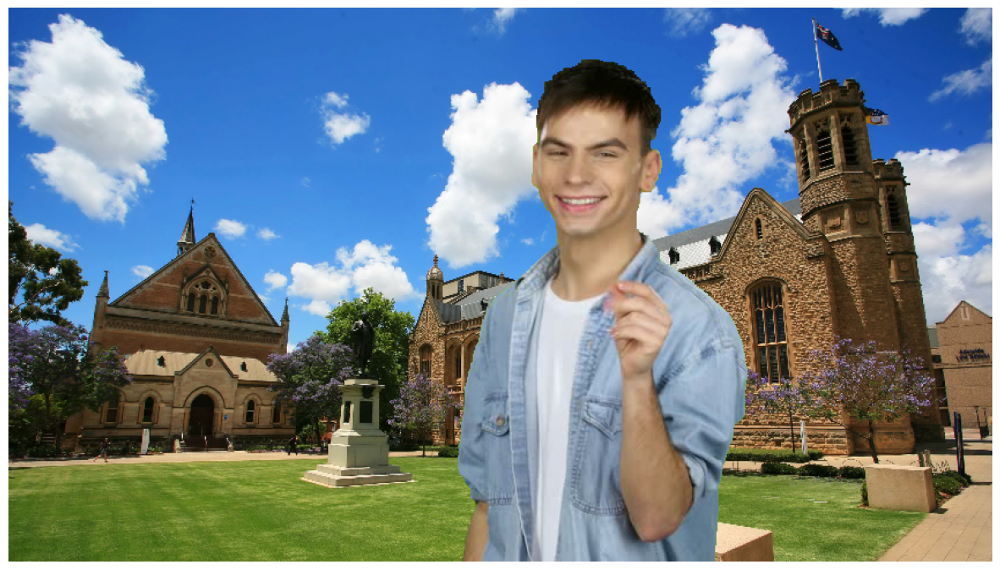

In [ ]:
result = segmented_actor + segmented_background
display_with_figsize(result, figsize=(15, 15))

The result looks kind of lame, right? How about we use Gaussian filter to make it better.

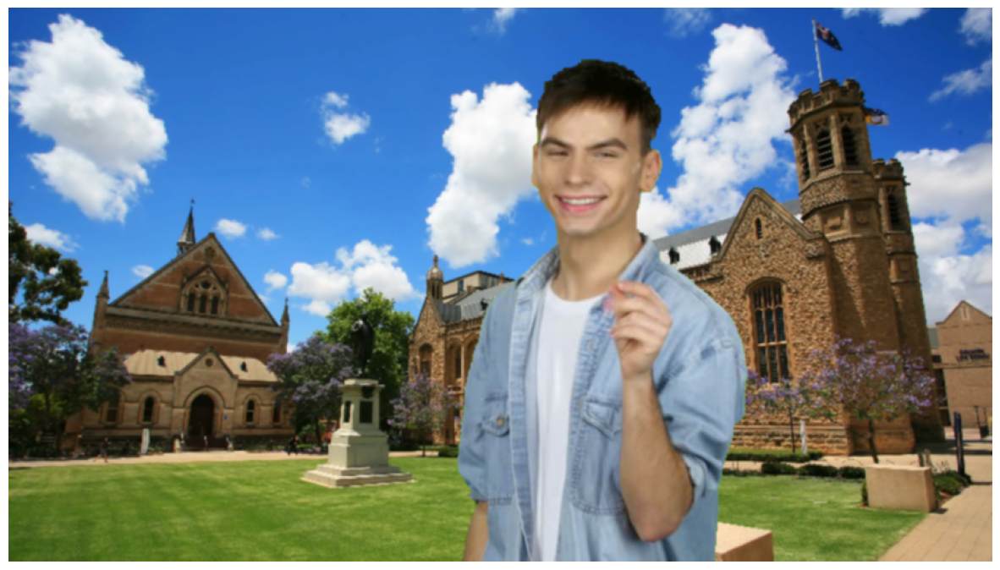

In [ ]:
blurred_result = cv2.GaussianBlur(result, (3,3), 0)
display_with_figsize(blurred_result, figsize=(15, 15))

# Some stupid & fun results

Note: To make result imaged look good, the original background image should have the same aspect ratio (w:h) as the foreground image (852:480). For example: (852:480), (1278:720), (1704:960), etc. You can use Paint to crop the background images first and use them in this notebook.

In [ ]:
def blend(segmented_actor, background, ksize=(3,3), target_size=(852, 480), figsize=(10, 10)):
    resized_background = cv2.resize(background, target_size)
    segmented_background = (1 - closing_mask) * resized_background
    result = segmented_actor + segmented_background
    blurred_result = cv2.GaussianBlur(result, ksize, 0)
    display_with_figsize(blurred_result, figsize)

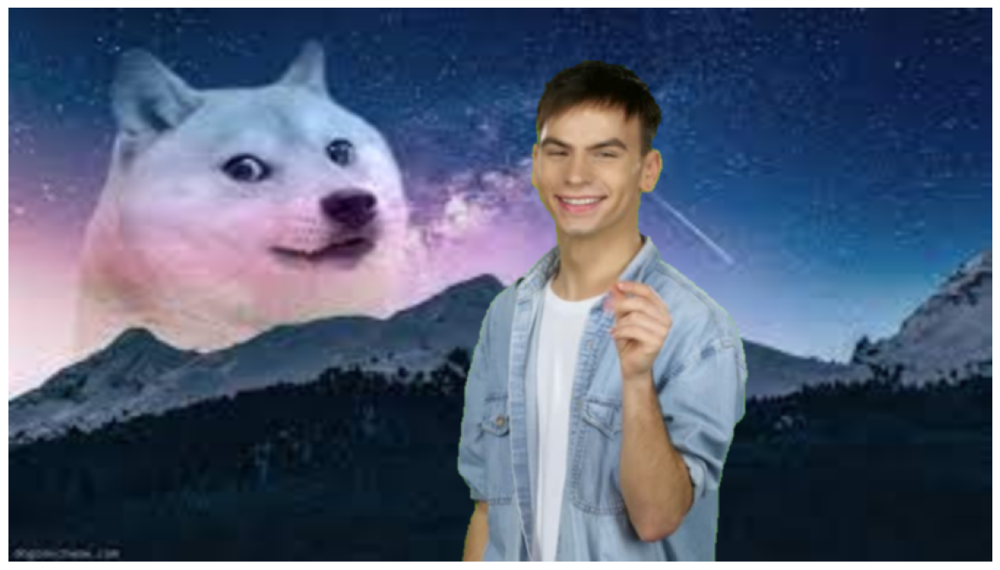

In [ ]:
img_name = "doge.jpeg"
background = cv2.imread(os.path.join(IMG_PATH, img_name))
bg = cv2.imread(os.path.join(IMG_PATH, img_name))
blend(segmented_actor, bg, ksize=(3,3), figsize=(15, 15))

# Other Results

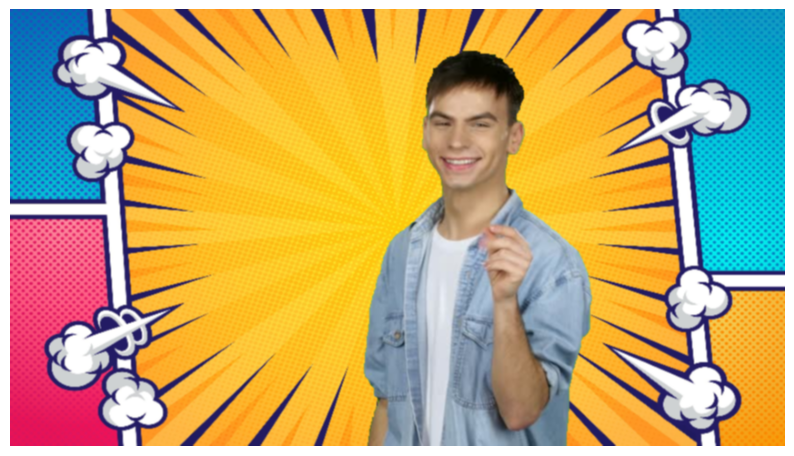

In [ ]:
bg = cv2.imread(os.path.join(IMG_PATH, 'comic.jpg'))
blend(segmented_actor, bg, ksize=(3,3), figsize=(10, 10))

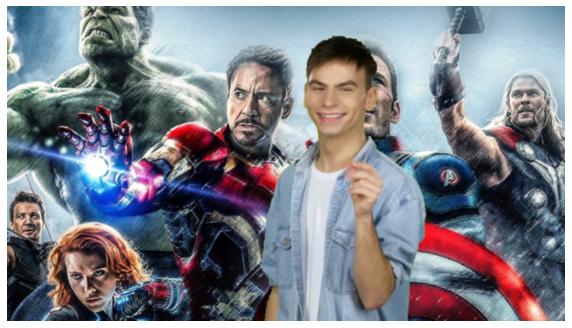

In [ ]:
bg = cv2.imread('avenger.jpg')
blend(segmented_actor, bg, ksize=(3,3), figsize=(10, 10))

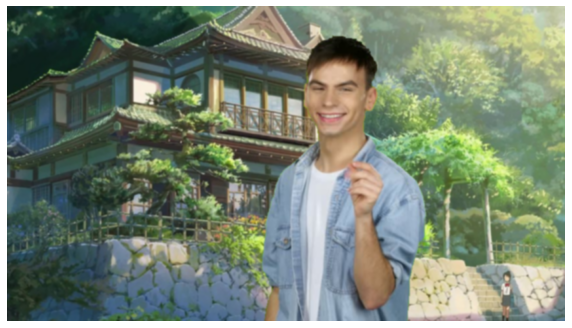

In [ ]:
bg = cv2.imread('yourname.jpg')
blend(segmented_actor, bg, ksize=(5,5), figsize=(10, 10))

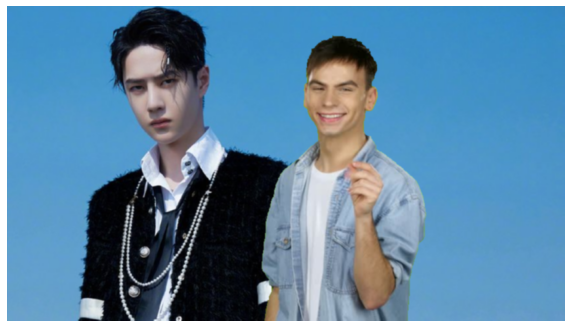

In [ ]:
bg = cv2.imread('yibo.jpg')
blend(segmented_actor, bg, ksize=(3,3), figsize=(10, 10))

# Extra: Green Screen Video

In [31]:
# Background
img_name = "UoA.jpeg"
background = cv2.imread(os.path.join(IMG_PATH, img_name))

# Read the video
video_name = "toothless_meme.mp4"
video_path = IMG_PATH + "/" + video_name
video = cv2.VideoCapture(video_path)

In [32]:
nb_frames = int(video.get(cv2.CAP_PROP_FRAME_COUNT))
frame_width = int(video.get(cv2.CAP_PROP_FRAME_WIDTH))
frame_height = int(video.get(cv2.CAP_PROP_FRAME_HEIGHT))
print(f"Number of frames: {nb_frames}, Video width: {frame_width}, Video height: {frame_height}")

Number of frames: 264, Video width: 960, Video height: 720


In [33]:
video_np = np.empty((nb_frames, frame_height, frame_width, 3), np.dtype('uint8'))
frame_id = 0
ret = True
while frame_id < nb_frames and ret:
    ret, video_np[frame_id] = video.read() # ret is a boolean variable that returns true if the frame is available
    frame_id += 1
video.release() # release software and hardware resource for reading/capturing video

In [34]:
video_np.shape # Number of frames, Height, Width, Color Channels

(264, 720, 960, 3)

## Handle one frame

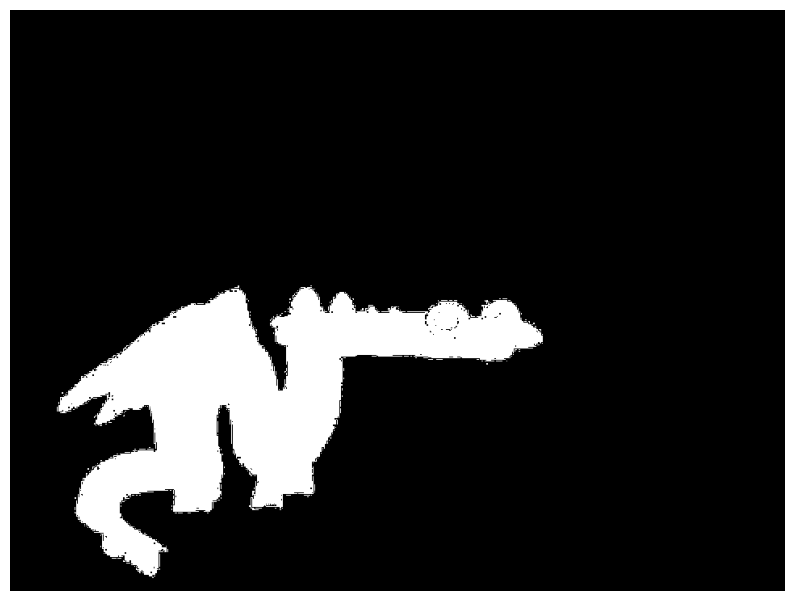

In [35]:
foreground = video_np[0]
target_size = (foreground.shape[1], foreground.shape[0]) # Width, Height
resized_background = cv2.resize(background, target_size)

foreground_hsv = cv2.cvtColor(foreground, cv2.COLOR_BGR2HSV)
mask = (foreground_hsv[:,:,0] < 58) | (foreground_hsv[:,:,0] > 60)

display_with_figsize(np.repeat(mask[:, :, np.newaxis], 3, axis=2).astype(np.uint8)*255, (10, 10))


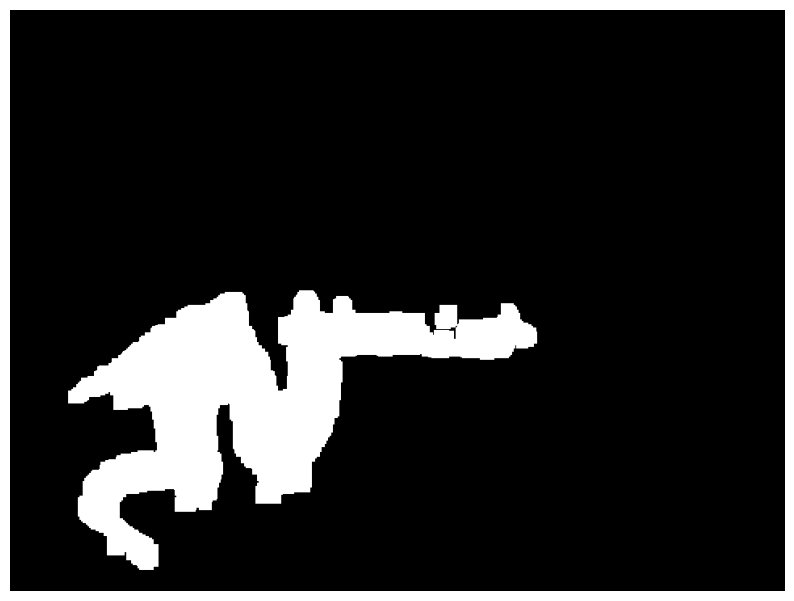

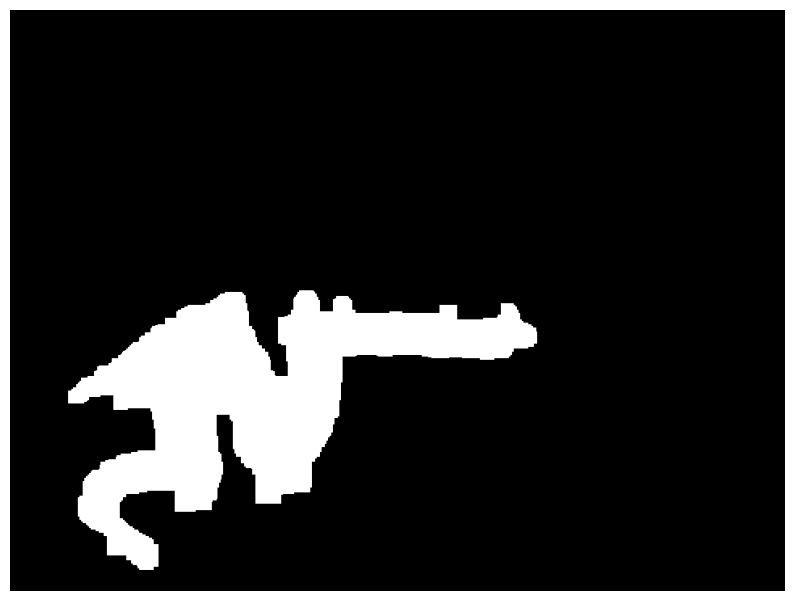

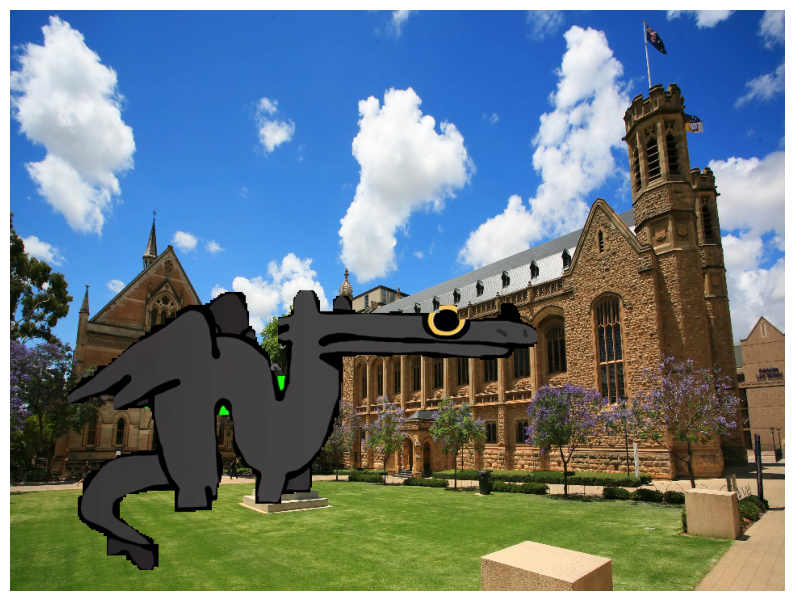

In [43]:
kernel = np.ones((15, 15), dtype=np.uint8)

# To eliminate small white dots that do not belong to the segmentation target, we use "OPEN" operation
mask = cv2.morphologyEx(np.float32(mask), cv2.MORPH_OPEN, kernel)
display_with_figsize(np.repeat(mask[:, :, np.newaxis], 3, axis=2)*255, (10, 10))

# To fill small holes that do belong to the segmentation target, we use "CLOSING" operation
closed_mask = cv2.morphologyEx(np.float32(mask), cv2.MORPH_CLOSE, kernel)
closed_mask = closed_mask.astype(np.uint8)
closed_mask = np.repeat(closed_mask[:, :, np.newaxis], 3, axis=2)
display_with_figsize(closed_mask*255, (10, 10))

segmented_actor = closed_mask * foreground
segmented_background = (1 - closed_mask) * resized_background

result = segmented_actor + segmented_background
display_with_figsize(result, (10, 10))

In [3]:
def blend_frame(foreground, background, ksize=(3,3), lower_threshold=58, upper_threshold=59):
    # ksize is used for Gaussian Blur, but we leave it out to simplify the program
    # Please feel free to use it if you need to.

    target_size = (foreground.shape[1], foreground.shape[0]) # Width, Height
    resized_background = cv2.resize(background, target_size)

    foreground_hsv = cv2.cvtColor(foreground, cv2.COLOR_BGR2HSV)
    mask = (foreground_hsv[:,:,0] < lower_threshold) | (foreground_hsv[:,:,0] > upper_threshold)
    kernel = np.ones((13, 13), dtype=np.uint8)
    closed_mask = cv2.morphologyEx(np.float32(mask), cv2.MORPH_OPEN, kernel)
    closed_mask = closed_mask.astype(np.uint8)
    closed_mask = np.repeat(closed_mask[:, :, np.newaxis], 3, axis=2)

    segmented_actor = closed_mask * foreground
    segmented_background = (1 - closed_mask) * resized_background

    result = segmented_actor + segmented_background
    return result

In [44]:
output = np.zeros((264, 720, 960, 3), dtype=np.uint8)
for i in range(len(video_np)):
    output[i] = blend_frame(video_np[i], background, ksize=(15,15), lower_threshold=57, upper_threshold=60)

In [45]:
# Write the numpy array 'output' to a video
FPS = 30
writer = cv2.VideoWriter("output.avi", cv2.VideoWriter_fourcc(*"MJPG"), FPS,(frame_width,frame_height))
for frame in output:
    writer.write(frame)
writer.release()

# Real-time Green Screen
This code can only be run in your local machine.

In [4]:
import IPython
import time
from io import BytesIO
import PIL

In [5]:
def get_frame(cam):
    # Capture frame-by-frame
    ret, frame = cam.read()
    #flip image for natural viewing
    frame = cv2.flip(frame, 1)
    return frame

In [6]:
#Use 'jpeg' instead of 'png' (~5 times faster)
def array_to_image(a, fmt='jpeg'):
    #Create binary stream object
    f = BytesIO()
    #Convert array to binary stream object
    PIL.Image.fromarray(a).save(f, fmt)
    return IPython.display.Image(data=f.getvalue())

Step 1. Run the first while loop to capture the static background  
Step 2. Save the static background as a numpy array for the next steps.  
Step 3. Load the static background  
Step 4: Rerun the while loop to see the result  

In [8]:
cam = cv2.VideoCapture(0)

d = IPython.display.display("", display_id=1)
d2 = IPython.display.display("", display_id=2)
while True:
    try:
        t1 = time.time()
        frame = get_frame(cam) # width 480 x height 640 x channels 3
        frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

        im = array_to_image(frame)

        d.update(im)

        t2 = time.time() + 0.0001

        s = f"""{int(1/(t2-t1))} FPS"""
        d2.update( IPython.display.HTML(s))
    except KeyboardInterrupt:
        print()
        cam.release()
        IPython.display.clear_output()
        print ("Stream stopped")
        break

Stream stopped


In [9]:
# Save the static background as a numpy file at the current directory
np.save('target.npy', frame)

In [10]:
# Only run this code after you run the first while loop to get the static background
target = np.load('target.npy')

In [13]:
cam = cv2.VideoCapture(0)

d = IPython.display.display("", display_id=1)
d2 = IPython.display.display("", display_id=2)
while True:
    try:
        t1 = time.time()
        frame = get_frame(cam) # width 480 x height 640 x channels 3
        frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

        result = blend_frame(frame, target, lower_threshold=56, upper_threshold=62) # Change the threshold values if needed

        im = array_to_image(result)

        d.update(im)

        t2 = time.time() + 0.0001

        s = f"""{int(1/(t2-t1))} FPS"""
        d2.update( IPython.display.HTML(s))
    except KeyboardInterrupt:
        print()
        cam.release()
        IPython.display.clear_output()
        print ("Stream stopped")
        break

Stream stopped


# Some Geometric Transformation of an Image and Corner Detection
Resources: https://docs.opencv.org/4.x/dc/d0d/tutorial_py_features_harris.html

In [ ]:
def display(img, caption=''):
    # Show image using pyplot
    plt.figure()
    plt.imshow(img, cmap='gray')
    plt.title(caption)
    plt.axis('off')
    plt.show()


In [ ]:
import matplotlib.pyplot as plt
import cv2 as cv
import numpy as np

In [ ]:
img = cv.imread("workshop1_imgs/test_img.jpg")
print(img.shape)

(548, 767, 3)


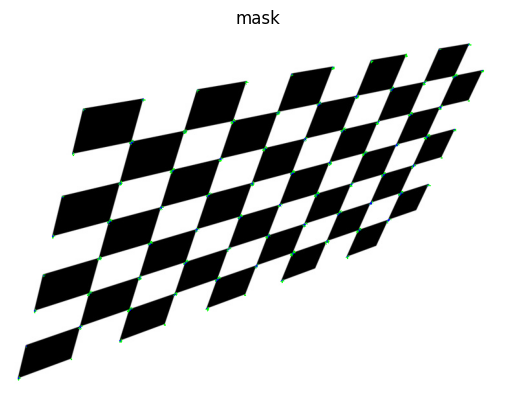

[[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]]


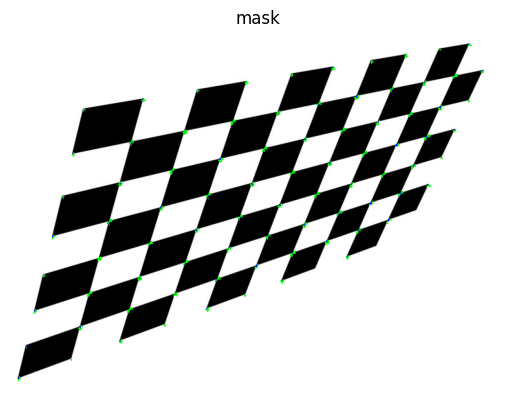

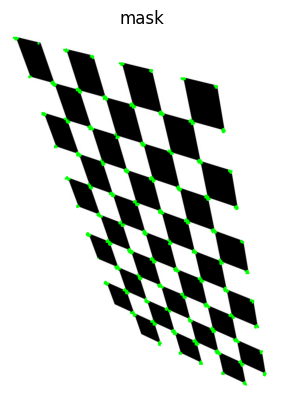

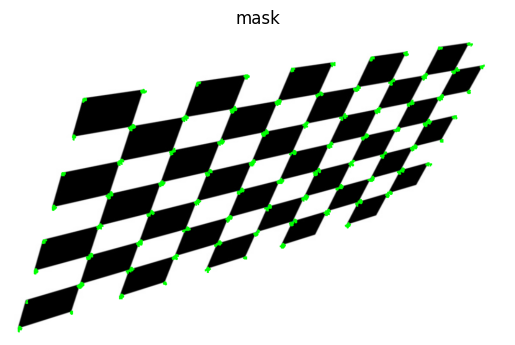

In [ ]:
gray = cv.cvtColor(img,cv.COLOR_BGR2GRAY)
gray = np.float32(gray)
dst = cv.cornerHarris(gray,2,3,0.04)
#result is dilated for marking the corners, not important

dst1 = cv.dilate(dst,(3,3))
# Threshold for an optimal value, it may vary depending on the image.
img[dst>0.01*dst.max()]=[0,255,0]
display(img,"mask")

print(dst1[1:5,1:5])
#img = cv.imread("/content/drive/MyDrive/Colab Notebooks/test_img.jpg",-1)
img[dst1>0.01*dst1.max()]=[0,255,0]
display(img,"mask")


#img = cv.imread("/content/drive/MyDrive/Colab Notebooks/test_img.jpg",-1)

image = cv.rotate(img, cv.ROTATE_90_CLOCKWISE)

gray = cv.cvtColor(image,cv.COLOR_BGR2GRAY)
gray = np.float32(gray)
dst = cv.cornerHarris(gray,2,3,0.04)
dst = cv.dilate(dst,None)
# Threshold for an optimal value, it may vary depending on the image.
image[dst>0.01*dst.max()]=[0,255,0]
display(image,"mask")


#Try changing the contrast
#Try changing the color
#Try changing the scale


#img = cv.imread("/content/drive/MyDrive/Colab Notebooks/test_img.jpg",-1)
output = cv.resize(img, (480*2,293*2))

gray = cv.cvtColor(output,cv.COLOR_BGR2GRAY)
gray = np.float32(gray)
dst = cv.cornerHarris(gray,2,3,0.04)
#result is dilated for marking the corners, not important
dst = cv.dilate(dst,None)
# Threshold for an optimal value, it may vary depending on the image.
output[dst>0.01*dst.max()]=[0,255,0]
display(output,"mask")